# Cloudless and Topographic-Corrected Landsat Composite

This script purpose is to generate cloudless/cloudmased and also topograhic corrected Landsat data based on certain region of interest and date fully using Python environment.

Landsat data used here is from [Microsoft Planetary Computer STAC / Azure Blob](https://planetarycomputer.microsoft.com/docs/quickstarts/reading-stac/). For now, it can be easily accessed but in future it probably need an account or even paid.

Cloud masking method are based on [Landsat QA PIXEL band](https://www.usgs.gov/landsat-missions/landsat-collection-2-quality-assessment-bands) and topographic correction is based on [SCS+C](https://ieeexplore.ieee.org/document/1499030) method

This script is tailored for [Landsat 8 and 9 Collection 2 Level 2 (Surface Reflectance)](https://planetarycomputer.microsoft.com/dataset/landsat-c2-l2), if you want to use it for other multispectral satellite data, you need to modify a lot.


In [3]:
from pystac_client import Client
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
import skimage as ski
import planetary_computer
import rasterio as rio
import numpy as np
import xarray as xr
from skimage.exposure import rescale_intensity
from rasterio.enums import Resampling
import rasterio.windows as windows
import rasterio.transform as transform

### Reading Region of Interest

The region of interest (ROI) can be from shapefile, geojson, kml, etc.. that can be read by GeoPandas

This ROI other than to filter the images available also to limit the analysis scope so that it does not have to download the whole scene instead only the one intersect with the ROI.


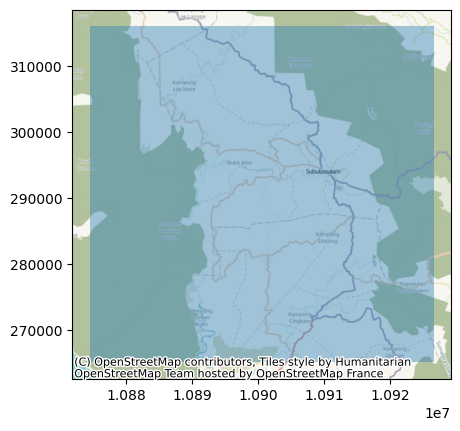

In [4]:
# Load the shapefile
roi = gpd.read_file("../../data/roi/example_roi_north_sumatera.shp")

# Plot it
ax = roi.to_crs(epsg=3857).plot(alpha=0.4)
cx.add_basemap(ax)

In [17]:
# Create landsat optimal shape
bounds = tuple(roi.total_bounds)
width = int(abs(bounds[2] - bounds[0]) * 110_000 / 30)
height = int(abs(bounds[3] - bounds[1]) * 110_000 / 30)
shape = (height, width)
transform_roi = transform.from_bounds(*bounds, height=height, width=width)
print(f"Optimal shape: {shape}")

Optimal shape: (1673, 1714)


### Reading STAC

In a STAC can be many sources of data. On this script, we will only using the Landsat Collection 2 Level 2.

Other collection is also available if you want to do analysis for other things.


In [6]:
# Load STAC
client = Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

### Filtering Images in the Collection

Using our ROI and time interval we can filter the collection that only fullfill this filter.

This filtered collection will have the information needed to load the image (including qa pixel) and the metadata topographic correction


In [7]:
# Parameter for search
# BBOX or boundary
bbox = roi.to_crs("EPSG:4326").union_all().bounds

# Look for certain ranges of date
# Use 4 months between 2024 may to 2024 august
start = "2024-05"
end = "2024-08"

# Use the landsat collection 2 level surface reflectance
# Filter only landsat 8 and 9
# Flter only tier 1 data (the good one)
landsat_col = client.search(
    collections=["landsat-c2-l2"],
    bbox=bbox,
    datetime=f"{start}/{end}",
    filter={
        "op": "and",
        "args": [
            {
                "op": "or",
                "args": [
                    {"op": "=", "args": [{"property": "platform"}, "landsat-8"]},
                    {"op": "=", "args": [{"property": "platform"}, "landsat-9"]},
                ],
            },
            {"op": "=", "args": [{"property": "landsat:collection_category"}, "T1"]},
        ],
    },
).item_collection()
landsat_col

### Preview of the filtered images

From all the filtered images, we can preview using the already rendered JPEG image from the collection. By previewing we can check if the filter is correct.


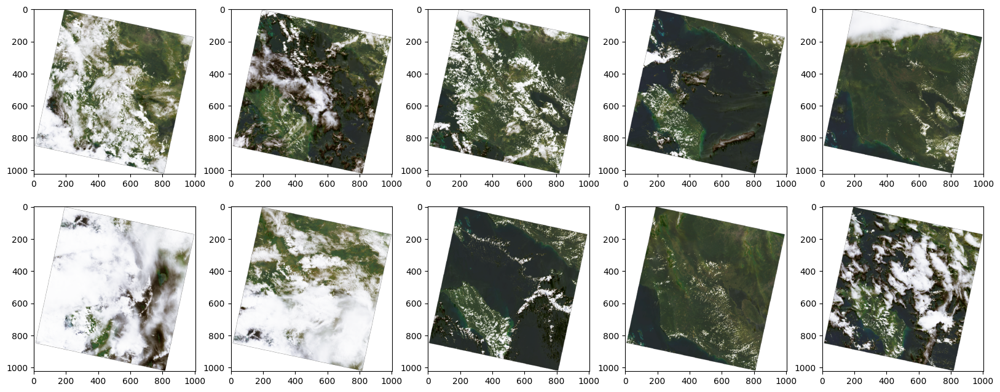

In [8]:
# Plot thumbnail every images
plt.figure(figsize=(20, 16))

# Load as plot
# Only the first 10
for x in range(0, len(landsat_col)):
    if x < 10:
        dict = landsat_col[x]
        thumbnail = dict.assets["rendered_preview"].href
        image = ski.io.imread(thumbnail)
        plt.subplot(4, 5, x + 1)
        plt.imshow(image)

### Load DEM

DEM (Digital Elevation Model) is important to do topographic correction.

The DEM used for this script is the NASADEM which also come from MPC STAC.


In [9]:
# Search DEM data
dem_collection = client.search(collections=["nasadem"], bbox=bbox).item_collection()

# Dem stack
dem_stack = []

# Load dem
for x in range(len(dem_collection)):
    with rio.open(dem_collection[x].assets["elevation"].href) as source:
        bounds_crs = tuple(roi.to_crs(source.crs).total_bounds)
        window = windows.from_bounds(*bounds_crs, transform=source.transform)
        dem = source.read(
            1, out_shape=shape, boundless=True, fill_value=source.nodata, window=window
        )
        dem = np.ma.array(dem, mask=dem == source.nodata)
        dem_stack.append(dem)

# Load DEM as rio
merge_dem = np.ma.max(np.ma.stack(dem_stack), 0)
merge_dem

masked_array(
  data=[[27, 27, 26, ..., 577, 579, 579],
        [25, 25, 24, ..., 572, 574, 575],
        [23, 23, 23, ..., 560, 565, 567],
        ...,
        [13, 16, 21, ..., 303, 308, 314],
        [12, 15, 20, ..., 306, 310, 315],
        [14, 18, 21, ..., 304, 308, 315]],
  mask=[[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]],
  fill_value=np.int64(999999),
  dtype=int16)

### Generate Slope and Aspect

DEM data can be derived into slope and aspect which can be used as parameter to do topographic correction


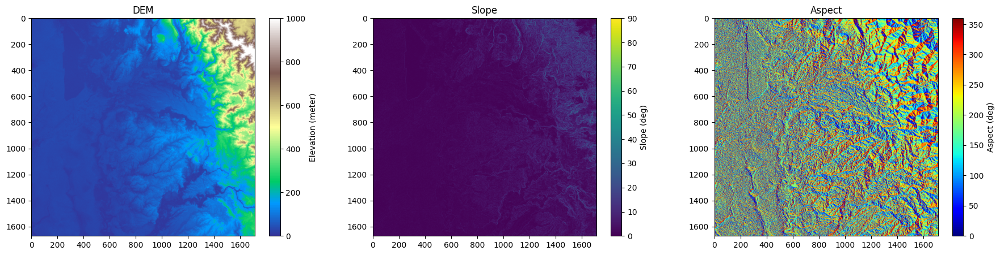

In [10]:
# Plot
plt.figure(figsize=(22, 5))

# Plot DEM
plt.subplot(1, 3, 1)
plt.title("DEM")
plt.imshow(merge_dem, vmin=0, vmax=1000, cmap="terrain")
plt.colorbar(label="Elevation (meter)")

# Pi
pi = 3.14159265359

# Make slope
py, px = np.gradient(merge_dem, 100)
slope = np.sqrt((px**2) + (py**2))
slope_deg = slope / 1 * 90
slope_rad = slope_deg / 180 * pi
plt.subplot(1, 3, 2)
plt.title("Slope")
plt.imshow(slope_deg, vmin=0, vmax=90)
plt.colorbar(label="Slope (deg)")

# Make aspect
aspect = np.arctan2(py, -px)
aspect_normalized = np.degrees(aspect)
aspect_normalized = (aspect_normalized + 360) % 360
aspect_rad = aspect_normalized / 180 * pi

plt.subplot(1, 3, 3)
plt.title("Aspect")
plt.imshow(aspect_normalized, vmin=0, vmax=360, cmap="jet")
plt.colorbar(label="Aspect (deg)")

### Load Images + Cloud Masking

From all the filtered images in the collection, we will loop it where we will load only the image bands needed

We will also load the qa pixel band where it contain the information needed to create clear mask to mask the image

The cloud masked image then will be put into a list where it will become a multi dimensional array that can be aggregated to get a cloudless median composite


Processing LC08_L2SP_129058_20240824_02_T1 (1 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC09_L2SP_129059_20240816_02_T1 (2 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC09_L2SP_129058_20240816_02_T1 (3 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC08_L2SP_129059_20240808_02_T1 (4 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC08_L2SP_129058_20240808_02_T1 (5 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC09_L2SP_129059_20240731_02_T1 (6 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1381.0..4000.0].


Processing LC09_L2SP_129058_20240731_02_T1 (7 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [838.0..4000.0].


Processing LC08_L2SP_129059_20240723_02_T1 (8 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC08_L2SP_129058_20240723_02_T1 (9 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC09_L2SP_129059_20240715_02_T1 (10 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [385.0..4000.0].


Processing LC09_L2SP_129058_20240715_02_T1 (11 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC08_L2SP_129058_20240707_02_T1 (12 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0044444444444444444..4000.0].


Processing LC09_L2SP_129059_20240629_02_T1 (13 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC09_L2SP_129058_20240629_02_T1 (14 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC08_L2SP_129059_20240621_02_T1 (15 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1066.0..4000.0].


Processing LC08_L2SP_129058_20240621_02_T1 (16 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [436.0..4000.0].


Processing LC09_L2SP_129059_20240613_02_T1 (17 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0071111111111111115..4000.0].


Processing LC09_L2SP_129058_20240613_02_T1 (18 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC08_L2SP_129059_20240605_02_T1 (19 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC08_L2SP_129058_20240605_02_T1 (20 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..4000.0].


Processing LC09_L2SP_129059_20240528_02_T1 (21 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22
Processing LC09_L2SP_129058_20240528_02_T1 (22 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22
Processing LC08_L2SP_129059_20240520_02_T1 (23 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22
Processing LC08_L2SP_129058_20240520_02_T1 (24 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Processing band swir16
Processing band swir22
Processing LC09_L2SP_129059_20240512_02_T1 (25 / 28)
Processing band coastal
Processing band blue
Processing band green
Processing band red
Processing band nir08
Proces

masked_array(
  data=[[[[212, 141, 173, ..., --, --, --],
          [46, 65, 191, ..., --, --, --],
          [65526, 46, 267, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --]],

         [[232, 206, 242, ..., --, --, --],
          [108, 129, 268, ..., --, --, --],
          [85, 121, 335, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --]],

         [[785, 754, 745, ..., --, --, --],
          [653, 651, 770, ..., --, --, --],
          [577, 654, 764, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --]],

         ...,

         [[5121, 5381, 5509, ..., --, --, --],
          [5321, 5413, 5639, ..., --, --, --],
          [5233, 5333, 5484, ..., --, --, --],
          ...,
 

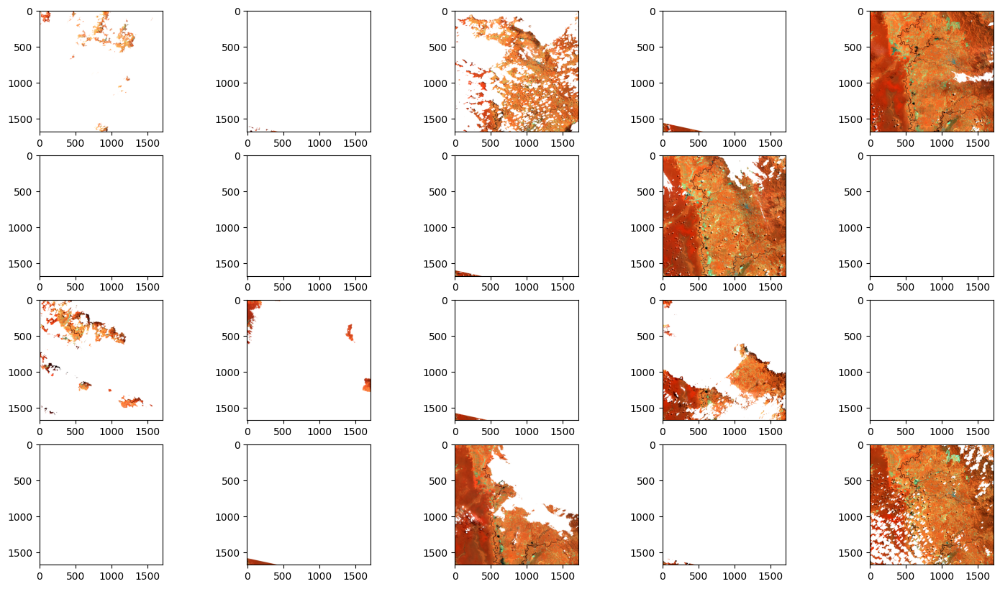

In [12]:
# Load the tif images
plt.figure(figsize=(18, 10))

# Select the bands needed
bands = ["coastal", "blue", "green", "red", "nir08", "swir16", "swir22"]
qband = "qa_pixel"

# Load bands
cloud_masked_images = []
for x in range(0, len(landsat_col)):
    # Get dict of data in the items
    data = landsat_col[x]
    print(f"Processing {data.id} ({x + 1} / {len(landsat_col)})")
    assets = data.assets

    # Get the quality band
    with rio.open(assets[qband].href) as qband_source:
        # Make window to read file only on specific part
        # Using our ROI BBOX to limit read
        qband_transform = qband_source.transform

        # Create a bbox based on the CRS of the image
        bbox_crs = tuple(roi.to_crs(qband_source.crs).total_bounds)

        # Window to read the imagew
        window = windows.from_bounds(*bbox_crs, transform=qband_transform)

        # Qband raster
        qband_image = qband_source.read(
            1,
            window=window,
            boundless=True,
            fill_value=qband_source.nodata,
            out_shape=shape,
        )

    # Make cloud mask
    cloud_mask = (
        ((qband_image & (1 << 1)) == 0)
        & ((qband_image & (1 << 2)) == 0)
        & ((qband_image & (1 << 3)) == 0)
        & ((qband_image & (1 << 4)) == 0)
    )

    # Cloud masked image
    stack = []
    for y in bands:
        print(f"Processing band {y}")

        with rio.open(assets[y].href) as source:
            nodata = source.nodata
            image = source.read(
                1, window=window, boundless=True, fill_value=nodata, out_shape=shape
            )
            image = np.ma.array(
                ((image * 0.0000275 - 0.2) * 1e4).astype("uint16"),
                mask=~cloud_mask | (image == nodata),
            )
            stack.append(image)

        del image

    del qband_image
    del cloud_mask

    # Combined all the image
    stack = np.ma.stack(stack)

    # Add all the image into one
    cloud_masked_images.append(stack)

    # Make composite using NIR SWIR1 SWIR2
    # Only 20 images
    if x < 20:
        # Make range into 0 - 1
        out_range = (0, 1)
        composite = np.dstack(
            [
                rescale_intensity(stack[4], in_range=(1000, 4000), out_range=out_range),
                rescale_intensity(stack[5], in_range=(500, 3000), out_range=out_range),
                rescale_intensity(
                    stack[6],
                    in_range=(250, 2500),
                    out_range=out_range,
                ),
            ]
        )

        # Plot
        plt.subplot(4, 5, x + 1)
        plt.imshow(composite)

    del stack

# Make list of images as numpy stack
cloud_masked_images = np.ma.stack(cloud_masked_images)
cloud_masked_images

### Apply Topographic Correction

Using the formula for SCS+C, the already cloud masked images then will be used as regression with incidence angle (generated using SCS+C method).

Only the images that have slope above 5 degree, incidence angle more than 0, and clear image (not cloud masked) will be applied topographic correction.


Processing LC08_L2SP_129058_20240824_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC09_L2SP_129059_20240816_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC09_L2SP_129058_20240816_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC08_L2SP_129059_20240808_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC08_L2SP_129058_20240808_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC09_L2SP_129059_20240731_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [250.0..1000.0].


Processing LC09_L2SP_129058_20240731_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [250.0..1000.0].


Processing LC08_L2SP_129059_20240723_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC08_L2SP_129058_20240723_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC09_L2SP_129059_20240715_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [250.0..1000.0].


Processing LC09_L2SP_129058_20240715_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC08_L2SP_129058_20240707_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.012444444444444444..1000.0].


Processing LC09_L2SP_129059_20240629_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC09_L2SP_129058_20240629_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC08_L2SP_129059_20240621_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [250.0..1000.0].


Processing LC08_L2SP_129058_20240621_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [250.0..1000.0].


Processing LC09_L2SP_129059_20240613_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0071111111111111115..1000.0].


Processing LC09_L2SP_129058_20240613_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC08_L2SP_129059_20240605_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC08_L2SP_129058_20240605_02_T1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1000.0].


Processing LC09_L2SP_129059_20240528_02_T1
Processing LC09_L2SP_129058_20240528_02_T1
Processing LC08_L2SP_129059_20240520_02_T1
Processing LC08_L2SP_129058_20240520_02_T1
Processing LC09_L2SP_129059_20240512_02_T1
Processing LC09_L2SP_129058_20240512_02_T1
Processing LC08_L2SP_129059_20240504_02_T1
Processing LC08_L2SP_129058_20240504_02_T1


masked_array(
  data=[[[[212, 141, 173, ..., --, --, --],
          [46, 65, 191, ..., --, --, --],
          [65526, 46, 267, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --]],

         [[231, 206, 242, ..., --, --, --],
          [108, 129, 268, ..., --, --, --],
          [85, 121, 335, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --]],

         [[785, 754, 745, ..., --, --, --],
          [653, 651, 770, ..., --, --, --],
          [577, 654, 764, ..., --, --, --],
          ...,
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --],
          [--, --, --, ..., --, --, --]],

         ...,

         [[5121, 5381, 5508, ..., --, --, --],
          [5321, 5413, 5639, ..., --, --, --],
          [5233, 5333, 5484, ..., --, --, --],
          ...,
 

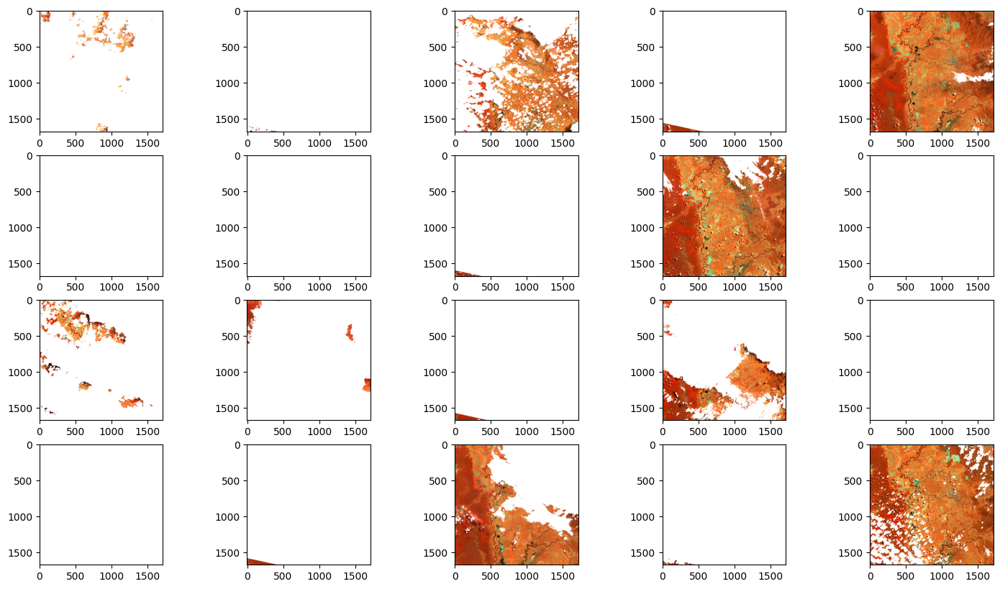

In [15]:
# Topographic corrected
plt.figure(figsize=(18, 10))
cloud_topo_images = []
for x in range(0, len(landsat_col)):
    # Read asset properties
    properties = landsat_col[x].properties
    print(f"Processing {landsat_col[x].id}")

    # Get the angle parameter for topographic correction
    azimuth_rad = properties["view:sun_azimuth"] * pi / 180
    elevation = properties["view:sun_elevation"]
    zenith_rad = (elevation - 90) * pi / 180

    # Another parameter for topographic correction
    cos_zenith = np.cos(zenith_rad)
    cos_slope = np.cos(slope_rad)
    slope_illumination = cos_zenith * cos_slope
    sin_zenith = np.sin(zenith_rad)
    sin_slope = np.sin(slope_rad)
    cos_azmiuth_dif = np.cos(azimuth_rad - aspect_rad)
    aspect_illumination = sin_zenith * sin_slope * cos_azmiuth_dif
    incidence_angle = slope_illumination + aspect_illumination

    # Copy of cloud masked image
    real_image = cloud_masked_images[x]
    copy_image = real_image.copy() / 1e4
    copy_image[copy_image.mask] = np.nan

    # Mask to do topographic correction
    mask_topo = (slope_deg >= 5) & (incidence_angle >= 0) & (copy_image[4] >= 0)
    mask_topo_1d = mask_topo.reshape(-1)

    # Incidence angle in 1 dimension
    ic_1d = incidence_angle.reshape(-1)[mask_topo_1d]

    # Do regression per band with incidence angle
    for y in range(0, len(copy_image)):
        # Get both only useful array
        image_band_1d = copy_image[y].reshape(-1)[mask_topo_1d]

        # If there is a valid data, do the regression
        if len(image_band_1d) & len(ic_1d):
            # Get the scale and offset of
            scale, offset = np.polyfit(ic_1d, image_band_1d, 1)

            # C data
            c = offset / scale

            # Apply topographic correction only to masked area
            copy_image[y] = np.where(
                mask_topo == 1,
                copy_image[y] * (cos_slope * cos_zenith + c) / (incidence_angle + c),
                copy_image[y],
            )

    copy_image = np.ma.array((copy_image * 1e4).astype("uint16"), mask=real_image.mask)

    # Make composite using NIR SWIR1 SWIR2
    # Only 20 bands
    if x < 20:
        # Make range into 0 - 1
        out_range = (0, 1)
        composite = np.dstack(
            [
                rescale_intensity(
                    copy_image[4],
                    in_range=(1000, 4000),
                    out_range=out_range,
                ),
                rescale_intensity(
                    copy_image[5],
                    in_range=(500, 3000),
                    out_range=out_range,
                ),
                rescale_intensity(
                    copy_image[6],
                    in_range=(250, 2500),
                    out_range=out_range,
                ),
            ]
        )

        # Plot
        plt.subplot(4, 5, x + 1)
        plt.imshow(composite)

    # Add each image to the list of images
    cloud_topo_images.append(copy_image)

    del copy_image

cloud_topo_images = np.ma.stack(cloud_topo_images)
cloud_topo_images

### Median Cloudless and Topographic Landsat Composite

From the stack of only cloudless images and cloudless + topographic corrected, a median aggregation is done on the first dimension where from 28 images returning in 1 image.

Here we visualize the difference in a plot of both images.


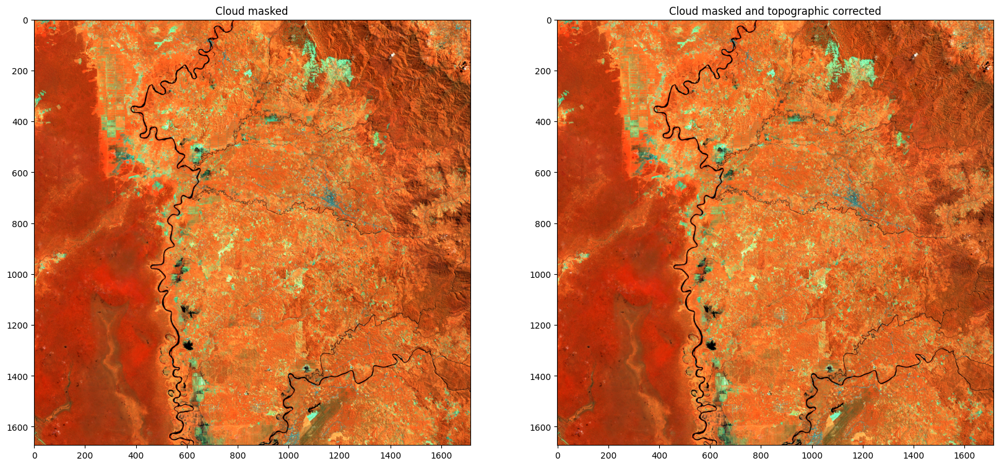

In [16]:
plt.figure(figsize=(20, 10))

## Cloud masked ##

# Median composite along its 0 axis
cloud_masked_median = np.ma.median(cloud_masked_images, 0) / 1e4

# Composite median for visualization
composite = np.dstack(
    [
        rescale_intensity(
            cloud_masked_median[4], in_range=(0.1, 0.4), out_range=(0, 1)
        ),
        rescale_intensity(
            cloud_masked_median[5],
            in_range=(0.05, 0.3),
            out_range=(0, 1),
        ),
        rescale_intensity(
            cloud_masked_median[6],
            in_range=(0.025, 0.25),
            out_range=(0, 1),
        ),
    ]
)

plt.subplot(1, 2, 1)
plt.title("Cloud masked")
plt.imshow(composite)

## Topographic Corrected ##

# Median composite along its 0 axis
cloud_topo_median = np.ma.median(cloud_topo_images, 0) / 1e4

# Composite median for visualization
composite = np.dstack(
    [
        rescale_intensity(cloud_topo_median[4], in_range=(0.1, 0.4), out_range=(0, 1)),
        rescale_intensity(cloud_topo_median[5], in_range=(0.05, 0.3), out_range=(0, 1)),
        rescale_intensity(
            cloud_topo_median[6],
            in_range=(0.025, 0.25),
            out_range=(0, 1),
        ),
    ]
)

plt.subplot(1, 2, 2)
plt.title("Cloud masked and topographic corrected")
plt.imshow(composite)

### Save the Image

If the result is satisfactory then saved it to the local storage


In [19]:
# Save image as geotiff
int_image_cloudless = np.nan_to_num(cloud_masked_median * 1e4, nan=-9999)
with rio.open(
    "cloudless_landsat_composite.tif",
    "w",
    "COG",
    count=int_image_cloudless.shape[0],
    width=int_image_cloudless.shape[2],
    height=int_image_cloudless.shape[1],
    crs=roi.crs,
    transform=transform_roi,
    nodata=-9999,
    dtype="int16",
    compress="lzw",
    resampling=Resampling.bilinear,
) as output:
    output.write(int_image_cloudless)
    output.descriptions = tuple(
        ["COASTAL", "BLUE", "GREEN", "RED", "NIR", "SWIR1", "SWIR2"]
    )

# Save image as geotiff the topocorrected
int_image_top = np.nan_to_num(cloud_topo_median * 1e4, nan=-9999)
with rio.open(
    "cloudless_topocorrect_landsat_composite.tif",
    "w",
    "COG",
    count=int_image_top.shape[0],
    width=int_image_top.shape[2],
    height=int_image_top.shape[1],
    crs=roi.crs,
    transform=transform_roi,
    nodata=-9999,
    dtype="int16",
    compress="lzw",
    resampling=Resampling.bilinear,
) as output:
    output.write(int_image_top)
    output.descriptions = tuple(
        ["COASTAL", "BLUE", "GREEN", "RED", "NIR", "SWIR1", "SWIR2"]
    )